# In this notebook I have attepmted to classify giant exoplanets ( more massive than Jupiter) and small exoplanets ( less massive than Jupiter) using Naive Bayes Classifier

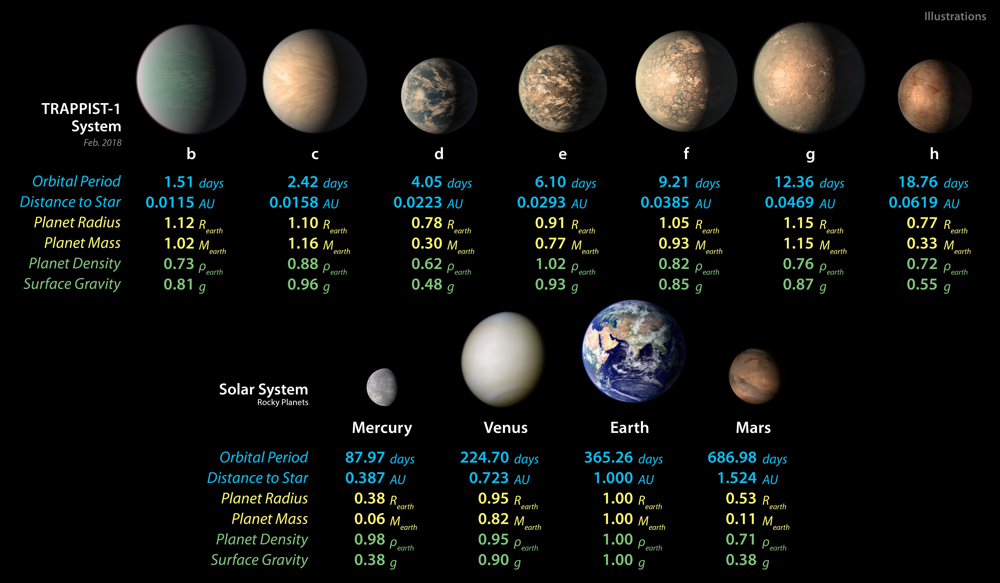

Credits: https://www.jpl.nasa.gov/images/pia22094-trappist-1-planet-lineup-updated-feb-2018

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy.stats import norm
from scipy.stats import multivariate_normal
from scipy.stats import multivariate_normal as mvn
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [2]:
#data=pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/training.csv')
data=pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/train_new.csv')

In [3]:
data #training

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,K2-113 b,K2-113,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,01h17m47.85s,19.449382,+06d52m07.85s,6.868847,635.7220,13.43000,-13.43000,NaN
1,KELT-11 b,KELT-11,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h46m49.66s,161.706905,-09d23m57.71s,-9.399365,99.1596,0.52105,-0.52105,NaN
2,TrES-2 b,TrES-2,NaN,0,2,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h07m14.05s,286.808526,+49d18m59.12s,49.316421,215.3200,1.05000,-1.03900,NaN
3,LTT 3780 b,LTT 3780,NaN,1,2,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h18m34.78s,154.644903,-11d43m04.08s,-11.717801,21.9814,0.04030,-0.04020,NaN
4,KELT-19 A b,KELT-19 A,NaN,1,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,07h26m02.29s,111.509529,+07d36m56.79s,7.615776,300.2760,4.68400,-4.54400,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,HAT-P-44 b,HAT-P-44,NaN,1,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,14h12m34.53s,213.143860,+47d00m53.22s,47.014783,347.8500,2.22600,-2.19900,NaN
1571,K2-146 b,K2-146,NaN,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h40m06.41s,130.026695,+19d05m32.43s,19.092342,79.3002,0.47800,-0.47230,NaN
1572,HATS-34 b,HATS-34,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,00h03m05.88s,0.774487,-62d28m09.54s,-62.469317,508.8420,3.89600,-3.89600,NaN
1573,CoRoT-5 b,CoRoT-5,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,06h45m06.54s,101.277240,+00d48m54.78s,0.815216,882.4720,25.62000,-25.62000,NaN


### Jupiter mass is 318 time earth mass. 
### So I have labeled the training data with mass > jupiter mass with 1 as giant planet and with 0 as small planet

In [4]:
data['label'] = np.where(data['pl_bmasse'] > 318, 1, 0)
data                                                        

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,K2-113 b,K2-113,1,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,01h17m47.85s,19.449382,+06d52m07.85s,6.868847,635.7220,13.43000,-13.43000,NaN
1,KELT-11 b,KELT-11,0,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h46m49.66s,161.706905,-09d23m57.71s,-9.399365,99.1596,0.52105,-0.52105,NaN
2,TrES-2 b,TrES-2,1,0,2,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h07m14.05s,286.808526,+49d18m59.12s,49.316421,215.3200,1.05000,-1.03900,NaN
3,LTT 3780 b,LTT 3780,0,1,2,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h18m34.78s,154.644903,-11d43m04.08s,-11.717801,21.9814,0.04030,-0.04020,NaN
4,KELT-19 A b,KELT-19 A,1,1,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,07h26m02.29s,111.509529,+07d36m56.79s,7.615776,300.2760,4.68400,-4.54400,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,HAT-P-44 b,HAT-P-44,0,1,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,14h12m34.53s,213.143860,+47d00m53.22s,47.014783,347.8500,2.22600,-2.19900,NaN
1571,K2-146 b,K2-146,0,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h40m06.41s,130.026695,+19d05m32.43s,19.092342,79.3002,0.47800,-0.47230,NaN
1572,HATS-34 b,HATS-34,0,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,00h03m05.88s,0.774487,-62d28m09.54s,-62.469317,508.8420,3.89600,-3.89600,NaN
1573,CoRoT-5 b,CoRoT-5,0,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,06h45m06.54s,101.277240,+00d48m54.78s,0.815216,882.4720,25.62000,-25.62000,NaN


In [5]:
#training data distribution.
data['label'].value_counts()    

0    1092
1     483
Name: label, dtype: int64

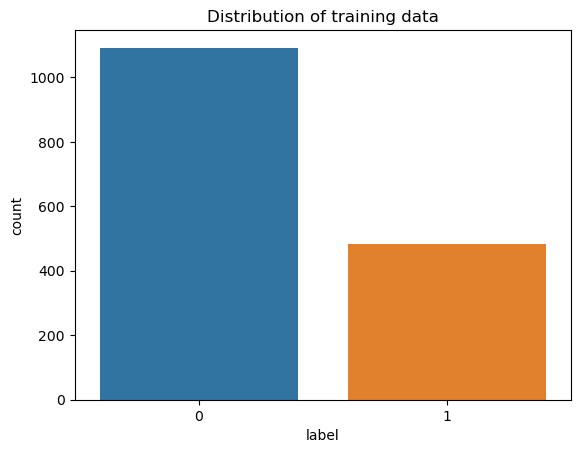

In [6]:
sns.countplot(x='label',data=data)
plt.title('Distribution of training data')
plt.show()     


# read the test data

In [7]:
#test_data=pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test.csv')
test_data=pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test_new.csv')
test_data.head()

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,Kepler-426 b,Kepler-426,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h17m44.32s,289.434667,+49d28m24.44s,49.473455,843.695,13.668,-13.668,NaN
1,TIC 172900988 b,TIC 172900988 Aa,NaN,0,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h34m38.80s,128.661664,+31d33m14.33s,31.553979,250.956,3.254,-3.172,NaN
2,TOI-1298 b,TOI-1298,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,16h05m17.50s,241.322901,+70d11m24.14s,70.190040,319.036,2.001,-1.978,NaN
3,WASP-74 b,WASP-74,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h18m09.32s,304.538843,-01d04m33.61s,-1.076003,149.216,1.149,-1.132,NaN
4,HAT-P-31 b,HAT-P-31,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,18h06m09.04s,271.537672,+26d25m35.78s,26.426606,344.050,2.913,-2.865,NaN


In [8]:
test_data['my_label'] = np.where(test_data['pl_bmasse'] > 318, 1, 0)
test_data  

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,Kepler-426 b,Kepler-426,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h17m44.32s,289.434667,+49d28m24.44s,49.473455,843.6950,13.668000,-13.668000,0
1,TIC 172900988 b,TIC 172900988 Aa,NaN,0,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h34m38.80s,128.661664,+31d33m14.33s,31.553979,250.9560,3.254000,-3.172000,1
2,TOI-1298 b,TOI-1298,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,16h05m17.50s,241.322901,+70d11m24.14s,70.190040,319.0360,2.001000,-1.978000,0
3,WASP-74 b,WASP-74,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h18m09.32s,304.538843,-01d04m33.61s,-1.076003,149.2160,1.149000,-1.132000,0
4,HAT-P-31 b,HAT-P-31,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,18h06m09.04s,271.537672,+26d25m35.78s,26.426606,344.0500,2.913000,-2.865000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
671,pi Men c,HD 39091,NaN,1,1,3,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,05h37m11.83s,84.299280,-80d27m52.57s,-80.464604,18.2702,0.022600,-0.022600,0
672,WTS-2 b,WTS-2,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h34m55.87s,293.732783,+36d48m55.78s,36.815494,NaN,NaN,NaN,1
673,AU Mic b,AU Mic,NaN,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h45m09.87s,311.291137,-31d20m32.82s,-31.342450,9.7221,0.004625,-0.004625,0
674,HAT-P-12 b,HAT-P-12,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,13h57m33.27s,209.388645,+43d29m35.92s,43.493310,142.7510,0.453000,-0.450000,0


In [9]:
# training the data
mass_mean = data.groupby('label')['pl_bmasse'].mean()
mass_std = data.groupby('label')['pl_bmasse'].std()
period_mean = data.groupby('label')['pl_orbper'].mean()
period_std = data.groupby('label')['pl_orbper'].std()                

In [10]:
prob_label = data['label'].value_counts()/len(data)

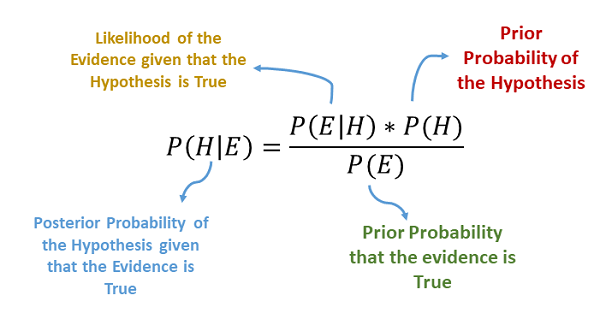

Credits :https://medium.com/analytics-vidhya/na%C3%AFve-bayes-algorithm-5bf31e9032a2

# Using Posterior Probability

In [11]:
#calculate posterior probability of each label
posterior_prob = []
for i in range(len(test_data)):
    prob_mass = norm.pdf(test_data['pl_bmasse'][i], mass_mean[0], mass_std[0])*norm.pdf(test_data['pl_orbper'][i], period_mean[0], period_std[0])*prob_label[0]
    prob_mass1 = norm.pdf(test_data['pl_bmasse'][i], mass_mean[1], mass_std[1])*norm.pdf(test_data['pl_orbper'][i], period_mean[1], period_std[1])*prob_label[1]
    posterior_prob.append(prob_mass/(prob_mass+prob_mass1))

/tmp/ipykernel_52515/1357331952.py:6: RuntimeWarning: invalid value encountered in double_scalars
  posterior_prob.append(prob_mass/(prob_mass+prob_mass1))


Text(0.5, 1.0, 'Histogram of Posterior Probability')

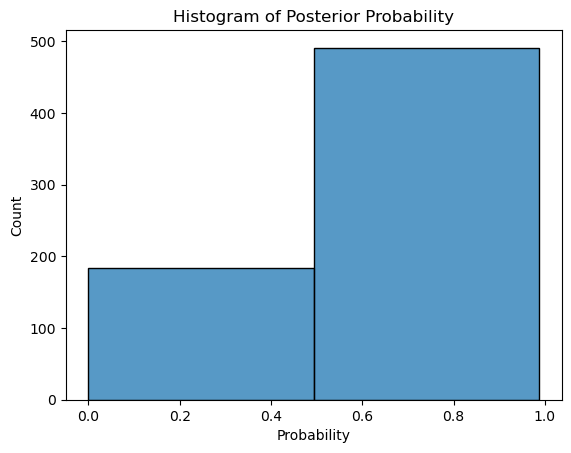

In [12]:
#plot a histogram of the posterior probability
sns.histplot(posterior_prob, bins=2)
plt.xlabel('Probability')
plt.ylabel('Count')
plt.title('Histogram of Posterior Probability')

In [13]:
# Label the test data based on this probability.

In [14]:
test_data['label'] = np.where(np.array(posterior_prob) < 0.5, 1, 0)

In [15]:
test_data.tail()

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
671,pi Men c,HD 39091,0,1,1,3,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,05h37m11.83s,84.299280,-80d27m52.57s,-80.464604,18.2702,0.022600,-0.022600,0
672,WTS-2 b,WTS-2,1,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h34m55.87s,293.732783,+36d48m55.78s,36.815494,NaN,NaN,NaN,1
673,AU Mic b,AU Mic,0,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h45m09.87s,311.291137,-31d20m32.82s,-31.342450,9.7221,0.004625,-0.004625,0
674,HAT-P-12 b,HAT-P-12,0,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,13h57m33.27s,209.388645,+43d29m35.92s,43.493310,142.7510,0.453000,-0.450000,0
675,WASP-38 b,WASP-38,1,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,16h15m50.33s,243.959719,+10d01m56.68s,10.032410,136.2400,0.807000,-0.798000,1


In [16]:
#test_data.to_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test_data.csv')

In [17]:
#comparing the predicted label with the actual label
print('Accuracy score: ',accuracy_score(test_data['my_label'],test_data['label']))
print('Confusion matrix: ',confusion_matrix(test_data['my_label'],test_data['label']))
print('Classification report: ',classification_report(test_data['my_label'],test_data['label']))

Accuracy score:  0.9334319526627219
Confusion matrix:  [[452   5]
 [ 40 179]]
Classification report:                precision    recall  f1-score   support

           0       0.92      0.99      0.95       457
           1       0.97      0.82      0.89       219

    accuracy                           0.93       676
   macro avg       0.95      0.90      0.92       676
weighted avg       0.94      0.93      0.93       676



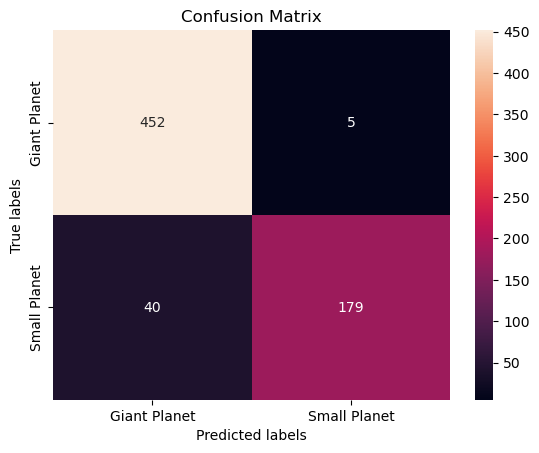

In [18]:
#plot a confusion matrix
cm = confusion_matrix(test_data['my_label'],test_data['label'])
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Giant Planet', 'Small Planet']); ax.yaxis.set_ticklabels(['Giant Planet', 'Small Planet']);

Area under ROC curve = 0.9032053395681585


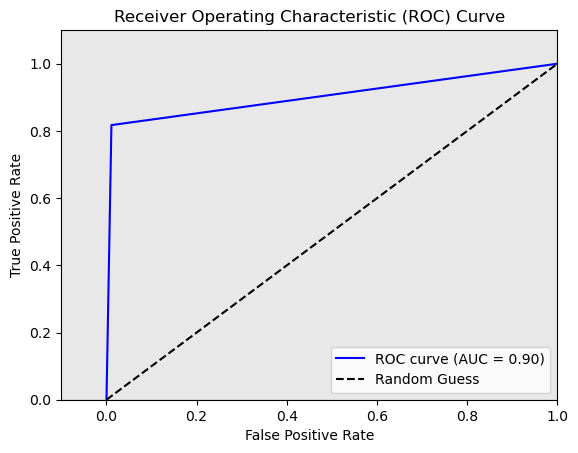

In [19]:
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score,confusion_matrix , roc_curve, auc, roc_curve,accuracy_score #,plot_confusion_matrix
# plot a roc curve
# Compute false positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(test_data['my_label'], test_data['label'])

# Compute area under the curve (AUC)
roc_auc = auc(fpr, tpr)
print('Area under ROC curve =',roc_auc)
# Create a figure and axis object
fig, ax = plt.subplots()

# Create a rectangle with a grey background
ax.fill_between([-1, 1], [1, 2], color='lightgrey', alpha=0.5)

# Plot the ROC curve on top of the rectangle
ax.plot(fpr, tpr, color='blue', label='ROC curve (AUC = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random Guess')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Receiver Operating Characteristic (ROC) Curve')
ax.set_xlim(-0.1,1)
ax.set_ylim(0,1.1)
ax.legend(loc="lower right")

# Show the plot
plt.show()

# Using Naive Bayes Classifier 

In [20]:
import pandas as pd
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import numpy as np
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score,confusion_matrix , roc_curve, auc, roc_curve,accuracy_score #,plot_confusion_matrix


# Load training data
#train_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/training.csv')
train_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/train_new.csv')
train_data

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,K2-113 b,K2-113,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,01h17m47.85s,19.449382,+06d52m07.85s,6.868847,635.7220,13.43000,-13.43000,NaN
1,KELT-11 b,KELT-11,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h46m49.66s,161.706905,-09d23m57.71s,-9.399365,99.1596,0.52105,-0.52105,NaN
2,TrES-2 b,TrES-2,NaN,0,2,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h07m14.05s,286.808526,+49d18m59.12s,49.316421,215.3200,1.05000,-1.03900,NaN
3,LTT 3780 b,LTT 3780,NaN,1,2,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h18m34.78s,154.644903,-11d43m04.08s,-11.717801,21.9814,0.04030,-0.04020,NaN
4,KELT-19 A b,KELT-19 A,NaN,1,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,07h26m02.29s,111.509529,+07d36m56.79s,7.615776,300.2760,4.68400,-4.54400,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,HAT-P-44 b,HAT-P-44,NaN,1,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,14h12m34.53s,213.143860,+47d00m53.22s,47.014783,347.8500,2.22600,-2.19900,NaN
1571,K2-146 b,K2-146,NaN,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h40m06.41s,130.026695,+19d05m32.43s,19.092342,79.3002,0.47800,-0.47230,NaN
1572,HATS-34 b,HATS-34,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,00h03m05.88s,0.774487,-62d28m09.54s,-62.469317,508.8420,3.89600,-3.89600,NaN
1573,CoRoT-5 b,CoRoT-5,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,06h45m06.54s,101.277240,+00d48m54.78s,0.815216,882.4720,25.62000,-25.62000,NaN


In [21]:
train_data['label'] = np.where(train_data['pl_bmasse'] > 318, 1, 0)
train_data   

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,K2-113 b,K2-113,1,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,01h17m47.85s,19.449382,+06d52m07.85s,6.868847,635.7220,13.43000,-13.43000,NaN
1,KELT-11 b,KELT-11,0,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h46m49.66s,161.706905,-09d23m57.71s,-9.399365,99.1596,0.52105,-0.52105,NaN
2,TrES-2 b,TrES-2,1,0,2,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h07m14.05s,286.808526,+49d18m59.12s,49.316421,215.3200,1.05000,-1.03900,NaN
3,LTT 3780 b,LTT 3780,0,1,2,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,10h18m34.78s,154.644903,-11d43m04.08s,-11.717801,21.9814,0.04030,-0.04020,NaN
4,KELT-19 A b,KELT-19 A,1,1,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,07h26m02.29s,111.509529,+07d36m56.79s,7.615776,300.2760,4.68400,-4.54400,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1570,HAT-P-44 b,HAT-P-44,0,1,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,14h12m34.53s,213.143860,+47d00m53.22s,47.014783,347.8500,2.22600,-2.19900,NaN
1571,K2-146 b,K2-146,0,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h40m06.41s,130.026695,+19d05m32.43s,19.092342,79.3002,0.47800,-0.47230,NaN
1572,HATS-34 b,HATS-34,0,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,00h03m05.88s,0.774487,-62d28m09.54s,-62.469317,508.8420,3.89600,-3.89600,NaN
1573,CoRoT-5 b,CoRoT-5,0,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,06h45m06.54s,101.277240,+00d48m54.78s,0.815216,882.4720,25.62000,-25.62000,NaN


In [22]:
train = train_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff', 'st_met','label']].copy()
#train = train_data[['pl_bmasse', 'pl_orbper', 'st_rad', 'st_met','label']].copy()
train=train.dropna()
train=train.reset_index(drop=True)
train

,pl_bmasse,pl_orbper,st_rad,st_teff,st_met,label
0,410.00070,5.817608,1.05,5627.0,0.18,1
1,61.97685,4.736529,2.72,5370.0,0.18,0
2,2.62000,0.768448,0.37,3331.0,0.28,0
3,1293.56810,4.611709,1.83,7500.0,-0.12,1
4,409.68287,1.338232,0.91,5500.0,-0.03,1
...,...,...,...,...,...,...
1170,111.87100,4.301219,0.95,5295.0,0.33,0
1171,5.60000,2.669800,0.35,3385.0,-0.02,0
1172,299.07803,2.106161,0.98,5380.0,0.25,0
1173,151.92274,4.037896,1.19,6100.0,-0.25,0


In [23]:
# Define features and target
X_train = train[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff','st_met']]  
#X_train = train[['pl_bmasse', 'pl_orbper', 'st_rad','st_met']]  
y_train = train['label']

In [24]:
# Fit Naive Bayes classifier
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)

GaussianNB()

In [25]:
# Load test data
#test_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test.csv')
test_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test_new.csv')
test_data

,#pl_name,hostname,label,default_flag,sy_snum,sy_pnum,discoverymethod,tran_flag,soltype,pl_controv_flag,...,st_logglim,sy_refname,rastr,ra,decstr,dec,sy_dist,sy_disterr1,sy_disterr2,my_label
0,Kepler-426 b,Kepler-426,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h17m44.32s,289.434667,+49d28m24.44s,49.473455,843.6950,13.668000,-13.668000,NaN
1,TIC 172900988 b,TIC 172900988 Aa,NaN,0,2,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,08h34m38.80s,128.661664,+31d33m14.33s,31.553979,250.9560,3.254000,-3.172000,NaN
2,TOI-1298 b,TOI-1298,NaN,1,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,16h05m17.50s,241.322901,+70d11m24.14s,70.190040,319.0360,2.001000,-1.978000,NaN
3,WASP-74 b,WASP-74,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h18m09.32s,304.538843,-01d04m33.61s,-1.076003,149.2160,1.149000,-1.132000,NaN
4,HAT-P-31 b,HAT-P-31,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,18h06m09.04s,271.537672,+26d25m35.78s,26.426606,344.0500,2.913000,-2.865000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
671,pi Men c,HD 39091,NaN,1,1,3,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,05h37m11.83s,84.299280,-80d27m52.57s,-80.464604,18.2702,0.022600,-0.022600,NaN
672,WTS-2 b,WTS-2,NaN,0,1,1,Transit,1,Published Confirmed,0,...,NaN,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,19h34m55.87s,293.732783,+36d48m55.78s,36.815494,NaN,NaN,NaN,NaN
673,AU Mic b,AU Mic,NaN,0,1,2,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,20h45m09.87s,311.291137,-31d20m32.82s,-31.342450,9.7221,0.004625,-0.004625,NaN
674,HAT-P-12 b,HAT-P-12,NaN,0,1,1,Transit,1,Published Confirmed,0,...,0.0,<a refstr=STASSUN_ET_AL__2019 href=https://ui....,13h57m33.27s,209.388645,+43d29m35.92s,43.493310,142.7510,0.453000,-0.450000,NaN


In [26]:
test = test_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff','st_met','my_label']].copy()
#test = test_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_met','my_label']].copy()

test

,pl_bmasse,pl_orbper,st_rad,st_teff,st_met,my_label
0,108.06000,3.217519,0.92,5725.0,-0.21,NaN
1,845.70000,190.375000,1.38,6050.0,0.34,NaN
2,113.14691,4.537164,1.41,5889.0,0.49,NaN
3,301.93850,2.137750,1.64,5970.0,0.39,NaN
4,682.38101,5.005425,1.36,6070.0,0.15,NaN
...,...,...,...,...,...,...
671,3.60604,6.267908,NaN,NaN,NaN,NaN
672,403.64410,1.018707,0.75,5000.0,0.20,NaN
673,17.10000,8.463210,0.75,3700.0,NaN,NaN
674,63.88383,3.213060,0.68,4665.0,-0.20,NaN


In [27]:
test['my_label'] = np.where(test['pl_bmasse'] > 318, 1, 0)
test=test.dropna()
test=test.reset_index(drop=True)
test

,pl_bmasse,pl_orbper,st_rad,st_teff,st_met,my_label
0,108.06000,3.217519,0.92,5725.0,-0.210,0
1,845.70000,190.375000,1.38,6050.0,0.340,1
2,113.14691,4.537164,1.41,5889.0,0.490,0
3,301.93850,2.137750,1.64,5970.0,0.390,0
4,682.38101,5.005425,1.36,6070.0,0.150,1
...,...,...,...,...,...,...
516,5.08000,0.280324,0.68,4599.0,-0.060,0
517,5.70000,13.338700,0.95,5496.0,0.060,0
518,1531.93292,10.655669,2.36,7360.0,0.094,1
519,403.64410,1.018707,0.75,5000.0,0.200,1


In [28]:
# Define features and target
X_test = test[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff','st_met']]
#X_test = test[['pl_bmasse', 'pl_orbper', 'st_rad','st_met']]
y_test = test['my_label']


In [29]:
# Make predictions using the trained classifier
y_pred = nb_classifier.predict(X_test)

In [30]:
# Evaluate performance
print('Accuracy score: ', accuracy_score(y_test, y_pred))
print('Confusion matrix: ', confusion_matrix(y_test, y_pred))
print('Classification report: ', classification_report(y_test, y_pred))

Accuracy score:  0.9328214971209213
Confusion matrix:  [[328   4]
 [ 31 158]]
Classification report:                precision    recall  f1-score   support

           0       0.91      0.99      0.95       332
           1       0.98      0.84      0.90       189

    accuracy                           0.93       521
   macro avg       0.94      0.91      0.92       521
weighted avg       0.94      0.93      0.93       521



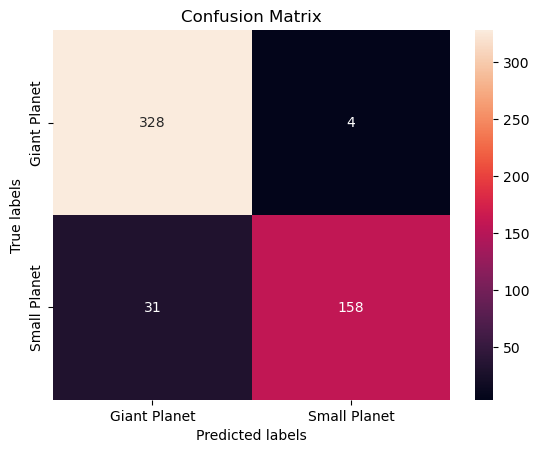

In [31]:
cm = confusion_matrix(y_test, y_pred)

ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Giant Planet', 'Small Planet']); ax.yaxis.set_ticklabels(['Giant Planet', 'Small Planet']);

In [32]:
# Make predictions using the trained classifier
y_pred_prob = nb_classifier.predict_proba(X_test)[:, 1]

Area under ROC curve = 0.987043411742207


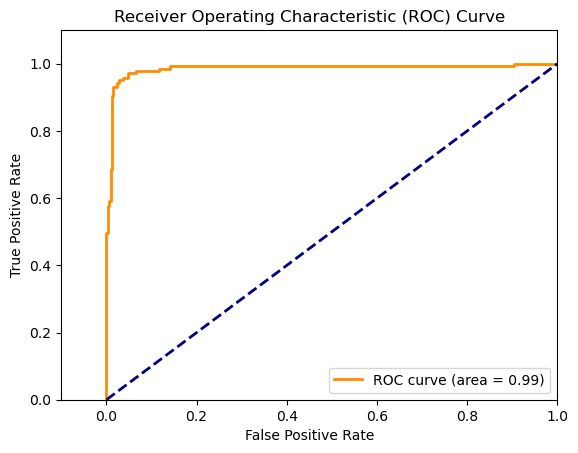

In [33]:
# Compute ROC curve and AUC score
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
print('Area under ROC curve =',roc_auc)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([-0.1,1])
plt.ylim([0,1.1])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Here I have classifies planet using posterior probability.
I have first classifies the test and training set as have giant planets and small planets where giant planets are more massive than jupiter and small planets are less than Jupiter

In [34]:
# Load training data
#train_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/training.csv')
train_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/train_new.csv')
#train_data

train_data['label'] = np.where(train_data['pl_bmasse'] > 318, 1, 0)
#train_data  


train = train_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff', 'st_met','label']].copy()
#train = train_data[['pl_bmasse', 'pl_orbper', 'st_rad', 'st_met','label']].copy()
train=train.dropna()
train=train.reset_index(drop=True)
#train



In [35]:
# Load test data
#test_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test.csv')
test_data = pd.read_csv('/home/sagarika/belgrade/astrobio/naive_bayes/test_new.csv')
test_data



test = test_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_teff','st_met','my_label']].copy()
#test = test_data[['pl_bmasse', 'pl_orbper', 'st_rad','st_met','my_label']].copy()

test['my_label'] = np.where(test['pl_bmasse'] > 318, 1, 0)
test=test.dropna()
test=test.reset_index(drop=True)

In [36]:

# Calculate posterior probability of positive class
mass_mean = train.groupby('label')['pl_bmasse'].mean()
mass_std = train.groupby('label')['pl_bmasse'].std()
period_mean = train.groupby('label')['pl_orbper'].mean()
period_std = train.groupby('label')['pl_orbper'].std()
star_temp_mean = train.groupby('label')['st_teff'].mean()
star_temp_std = train.groupby('label')['st_teff'].std()
star_radius_mean = train.groupby('label')['st_rad'].mean()
star_radius_std = train.groupby('label')['st_rad'].std()
star_met_mean = train.groupby('label')['st_met'].mean()
star_met_std = train.groupby('label')['st_met'].std()


prob_label = train['label'].value_counts()/len(train)

posterior_prob = []
for i in range(len(test)):
    prob_mass = norm.pdf(test['pl_bmasse'][i], mass_mean[0], mass_std[0])*norm.pdf(test['pl_orbper'][i], period_mean[0], period_std[0])*norm.pdf(test['st_teff'][i], star_temp_mean[0], star_temp_std[0])*norm.pdf(test['st_rad'][i], star_radius_mean[0], star_radius_std[0])*norm.pdf(test['st_met'][i], star_met_mean[0], star_met_std[0])*prob_label[0]
    prob_mass1 = norm.pdf(test['pl_bmasse'][i], mass_mean[1], mass_std[1])*norm.pdf(test['pl_orbper'][i], period_mean[1], period_std[1])*norm.pdf(test['st_teff'][i], star_temp_mean[1], star_temp_std[1])*norm.pdf(test['st_rad'][i], star_radius_mean[1], star_radius_std[1])*norm.pdf(test['st_met'][i], star_met_mean[1], star_met_std[1])*prob_label[1]
    posterior_prob.append(prob_mass/(prob_mass+prob_mass1))


In [37]:
test['label'] = np.where(np.array(posterior_prob) < 0.5, 1, 0)

In [38]:
test

,pl_bmasse,pl_orbper,st_rad,st_teff,st_met,my_label,label
0,108.06000,3.217519,0.92,5725.0,-0.210,0,0
1,845.70000,190.375000,1.38,6050.0,0.340,1,1
2,113.14691,4.537164,1.41,5889.0,0.490,0,0
3,301.93850,2.137750,1.64,5970.0,0.390,0,0
4,682.38101,5.005425,1.36,6070.0,0.150,1,1
...,...,...,...,...,...,...,...
516,5.08000,0.280324,0.68,4599.0,-0.060,0,0
517,5.70000,13.338700,0.95,5496.0,0.060,0,0
518,1531.93292,10.655669,2.36,7360.0,0.094,1,1
519,403.64410,1.018707,0.75,5000.0,0.200,1,0


In [39]:
#comparing the predicted label with the actual label
print('Accuracy score: ',accuracy_score(test['my_label'],test['label']))
print('Confusion matrix: ',confusion_matrix(test['my_label'],test['label']))
print('Classification report: ',classification_report(test['my_label'],test['label']))

Accuracy score:  0.9328214971209213
Confusion matrix:  [[328   4]
 [ 31 158]]
Classification report:                precision    recall  f1-score   support

           0       0.91      0.99      0.95       332
           1       0.98      0.84      0.90       189

    accuracy                           0.93       521
   macro avg       0.94      0.91      0.92       521
weighted avg       0.94      0.93      0.93       521



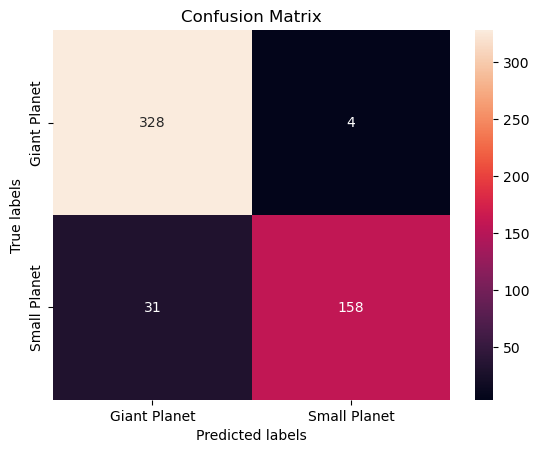

In [40]:
#plot a confusion matrix
cm = confusion_matrix(test['my_label'],test['label'])
ax= plt.subplot()
sns.heatmap(cm, annot=True, fmt='g',ax=ax);  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['Giant Planet', 'Small Planet']); ax.yaxis.set_ticklabels(['Giant Planet', 'Small Planet']);

Area under ROC curve = 0.9119653216038757


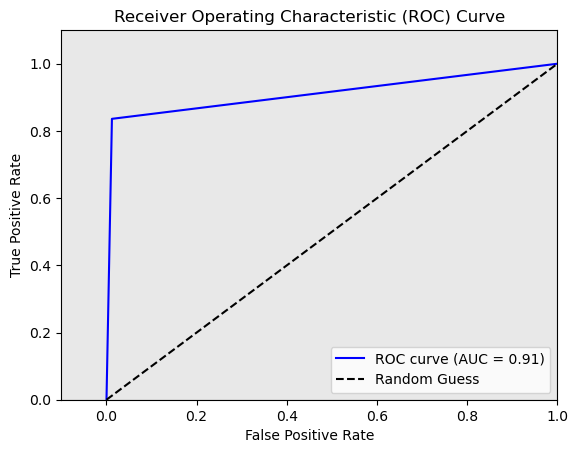

In [41]:
from sklearn.metrics import recall_score, precision_score, classification_report,accuracy_score,confusion_matrix , roc_curve, auc, roc_curve,accuracy_score #,plot_confusion_matrix
# plot a roc curve
# Compute false positive rate and true positive rate
fpr, tpr, thresholds = roc_curve(test['my_label'], test['label'])

# Compute area under the curve (AUC)
roc_auc = auc(fpr, tpr)
print('Area under ROC curve =',roc_auc)
# Create a figure and axis object
fig, ax = plt.subplots()

# Create a rectangle with a grey background
ax.fill_between([-1, 1], [1, 2], color='lightgrey', alpha=0.5)

# Plot the ROC curve on top of the rectangle
ax.plot(fpr, tpr, color='blue', label='ROC curve (AUC = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random Guess')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('Receiver Operating Characteristic (ROC) Curve')
ax.set_xlim(-0.1,1)
ax.set_ylim(0,1.1)
ax.legend(loc="lower right")

# Show the plot
plt.show()